In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 12

# for the filename
parameters = "2-0_5-12"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 17.005993366241455
My own part is done: 0.9089546203613281
Time for data preperation:  86.03985214233398


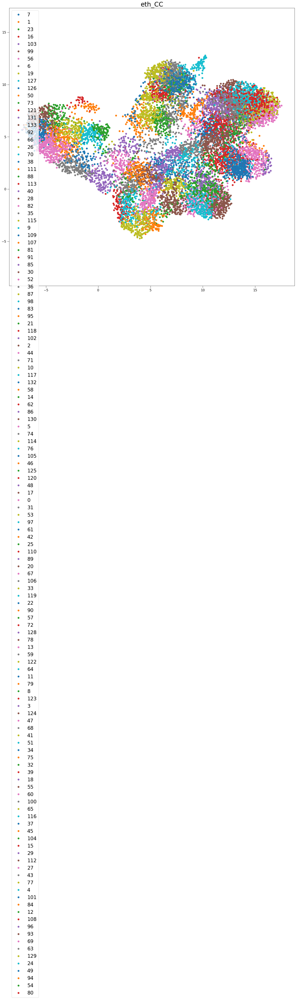

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                        break
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
            cleaned_components[idx] = True
            continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/81 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/125 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1188 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/124 [00:00<?, ?it/s]

update Arr 1188 -> 1079
update Arr 1079 -> 980
update Arr 980 -> 890
update Arr 890 -> 803
update Arr 803 -> 723
update Arr 723 -> 657
update Arr 657 -> 595
update Arr 595 -> 537
update Arr 537 -> 486
update Arr 486 -> 441
update Arr 441 -> 400
update Arr 400 -> 355
update Arr 355 -> 317
update Arr 317 -> 285
update Arr 285 -> 255
update Arr 255 -> 227
update Arr 227 -> 202
update Arr 202 -> 179
update Arr 179 -> 161
update Arr 161 -> 143
update Arr 143 -> 133
update Arr 133 -> 131
update Arr 131 -> 129
update Arr 129 -> 126
update Arr 126 -> 125


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2754 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2754 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2754 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 2754 -> 2470
added 4 edges early
update Arr 2470 -> 2208
update Arr 2208 -> 2002
update Arr 2002 -> 1815
update Arr 1815 -> 1645
update Arr 1645 -> 1492
update Arr 1492 -> 1350
update Arr 1350 -> 1221
update Arr 1221 -> 1103
update Arr 1103 -> 1001
update Arr 1001 -> 898
update Arr 898 -> 809
update Arr 809 -> 732
update Arr 732 -> 657
update Arr 657 -> 597
update Arr 597 -> 542
update Arr 542 -> 484
update Arr 484 -> 433
update Arr 433 -> 390
update Arr 390 -> 354
update Arr 354 -> 319
update Arr 319 -> 288
update Arr 288 -> 285
update Arr 285 -> 283
update Arr 283 -> 282
update Arr 282 -> 281
update Arr 281 -> 279
update Arr 279 -> 278
update Arr 278 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1559 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1559 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1559 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 1559 -> 1412
added 2 edges early
update Arr 1412 -> 1275
update Arr 1275 -> 1154
update Arr 1154 -> 1044
update Arr 1044 -> 945
update Arr 945 -> 858
update Arr 858 -> 774
update Arr 774 -> 701
update Arr 701 -> 636
update Arr 636 -> 571
update Arr 571 -> 519
update Arr 519 -> 470
update Arr 470 -> 424
update Arr 424 -> 382
update Arr 382 -> 346
update Arr 346 -> 311
update Arr 311 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 199
update Arr 199 -> 171
added 7 edges early
update Arr 171 -> 171
update Arr 171 -> 169
update Arr 169 -> 167
update Arr 167 -> 166


calculating the densities for the density criterion:   0%|          | 0/353 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3519 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/3519 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3519 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/352 [00:00<?, ?it/s]

update Arr 3519 -> 3187
added 7 edges early
update Arr 3187 -> 2887
update Arr 2887 -> 2602
update Arr 2602 -> 2359
update Arr 2359 -> 2142
update Arr 2142 -> 1945
update Arr 1945 -> 1765
update Arr 1765 -> 1598
update Arr 1598 -> 1452
update Arr 1452 -> 1314
update Arr 1314 -> 1191
update Arr 1191 -> 1082
update Arr 1082 -> 979
update Arr 979 -> 889
update Arr 889 -> 805
update Arr 805 -> 729
update Arr 729 -> 657
update Arr 657 -> 597
update Arr 597 -> 537
update Arr 537 -> 478
update Arr 478 -> 434
update Arr 434 -> 392
update Arr 392 -> 362
update Arr 362 -> 361
update Arr 361 -> 360
update Arr 360 -> 359
update Arr 359 -> 357
update Arr 357 -> 356
update Arr 356 -> 355


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1148 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 1148 -> 1039
update Arr 1039 -> 937
update Arr 937 -> 850
update Arr 850 -> 768
update Arr 768 -> 693
update Arr 693 -> 628
update Arr 628 -> 564
update Arr 564 -> 505
update Arr 505 -> 455
update Arr 455 -> 410
update Arr 410 -> 369
update Arr 369 -> 332
update Arr 332 -> 297
update Arr 297 -> 266
update Arr 266 -> 239
update Arr 239 -> 215
update Arr 215 -> 193
update Arr 193 -> 169
update Arr 169 -> 152
update Arr 152 -> 135
update Arr 135 -> 128
update Arr 128 -> 128
update Arr 128 -> 127
update Arr 127 -> 126


calculating the densities for the density criterion:   0%|          | 0/219 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2115 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/218 [00:00<?, ?it/s]

update Arr 2115 -> 1914
added 3 edges early
update Arr 1914 -> 1732
update Arr 1732 -> 1570
update Arr 1570 -> 1422
update Arr 1422 -> 1285
update Arr 1285 -> 1161
update Arr 1161 -> 1051
update Arr 1051 -> 954
update Arr 954 -> 866
update Arr 866 -> 785
update Arr 785 -> 707
update Arr 707 -> 642
update Arr 642 -> 579
update Arr 579 -> 526
update Arr 526 -> 474
update Arr 474 -> 426
update Arr 426 -> 380
update Arr 380 -> 343
update Arr 343 -> 308
update Arr 308 -> 276
update Arr 276 -> 250
update Arr 250 -> 225
update Arr 225 -> 222
update Arr 222 -> 220
update Arr 220 -> 219


calculating the densities for the density criterion:   0%|          | 0/375 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3761 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/3761 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3761 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/374 [00:00<?, ?it/s]

update Arr 3761 -> 3416
added 8 edges early
update Arr 3416 -> 3060
update Arr 3060 -> 2776
update Arr 2776 -> 2523
update Arr 2523 -> 2293
update Arr 2293 -> 2080
update Arr 2080 -> 1890
update Arr 1890 -> 1715
update Arr 1715 -> 1554
update Arr 1554 -> 1402
update Arr 1402 -> 1273
update Arr 1273 -> 1156
update Arr 1156 -> 1049
update Arr 1049 -> 952
update Arr 952 -> 865
update Arr 865 -> 784
update Arr 784 -> 706
update Arr 706 -> 639
update Arr 639 -> 578
update Arr 578 -> 516
update Arr 516 -> 468
update Arr 468 -> 425
update Arr 425 -> 386
update Arr 386 -> 382
update Arr 382 -> 381
update Arr 381 -> 378
update Arr 378 -> 378
update Arr 378 -> 377
update Arr 377 -> 376
update Arr 376 -> 375


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/919 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/919 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/919 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 919 -> 825
update Arr 825 -> 744
update Arr 744 -> 670
update Arr 670 -> 606
update Arr 606 -> 549
update Arr 549 -> 497
update Arr 497 -> 451
update Arr 451 -> 400
update Arr 400 -> 356
update Arr 356 -> 314
update Arr 314 -> 283
update Arr 283 -> 256
update Arr 256 -> 232
update Arr 232 -> 205
update Arr 205 -> 186
update Arr 186 -> 164
update Arr 164 -> 141
update Arr 141 -> 126
update Arr 126 -> 113
update Arr 113 -> 110
update Arr 110 -> 107
update Arr 107 -> 102
update Arr 102 -> 102
update Arr 102 -> 101


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/921 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/921 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/921 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 921 -> 832
update Arr 832 -> 752
update Arr 752 -> 677
update Arr 677 -> 604
update Arr 604 -> 545
update Arr 545 -> 485
update Arr 485 -> 435
update Arr 435 -> 385
update Arr 385 -> 348
update Arr 348 -> 309
update Arr 309 -> 279
update Arr 279 -> 251
update Arr 251 -> 227
update Arr 227 -> 203
update Arr 203 -> 183
update Arr 183 -> 166
update Arr 166 -> 148
update Arr 148 -> 131
update Arr 131 -> 115
update Arr 115 -> 110
update Arr 110 -> 105
update Arr 105 -> 103
update Arr 103 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/150 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1468 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1468 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1468 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 1468 -> 1325
update Arr 1325 -> 1201
update Arr 1201 -> 1090
update Arr 1090 -> 983
update Arr 983 -> 888
update Arr 888 -> 791
update Arr 791 -> 719
update Arr 719 -> 648
update Arr 648 -> 586
update Arr 586 -> 529
update Arr 529 -> 480
update Arr 480 -> 433
update Arr 433 -> 391
update Arr 391 -> 351
update Arr 351 -> 318
update Arr 318 -> 288
update Arr 288 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 180
update Arr 180 -> 161
update Arr 161 -> 159
update Arr 159 -> 153
update Arr 153 -> 153
update Arr 153 -> 152
update Arr 152 -> 151


calculating the densities for the density criterion:   0%|          | 0/161 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1573 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1573 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1573 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/160 [00:00<?, ?it/s]

update Arr 1573 -> 1424
update Arr 1424 -> 1289
update Arr 1289 -> 1159
update Arr 1159 -> 1051
update Arr 1051 -> 951
update Arr 951 -> 857
update Arr 857 -> 766
update Arr 766 -> 678
update Arr 678 -> 616
update Arr 616 -> 557
update Arr 557 -> 499
update Arr 499 -> 452
update Arr 452 -> 408
update Arr 408 -> 362
update Arr 362 -> 329
update Arr 329 -> 292
update Arr 292 -> 254
update Arr 254 -> 227
update Arr 227 -> 203
update Arr 203 -> 183
update Arr 183 -> 170
update Arr 170 -> 169
update Arr 169 -> 166
update Arr 166 -> 164
update Arr 164 -> 164
update Arr 164 -> 161


calculating the densities for the density criterion:   0%|          | 0/171 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1635 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1635 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1635 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/170 [00:00<?, ?it/s]

update Arr 1635 -> 1474
update Arr 1474 -> 1310
update Arr 1310 -> 1185
update Arr 1185 -> 1065
update Arr 1065 -> 968
update Arr 968 -> 877
update Arr 877 -> 794
update Arr 794 -> 721
update Arr 721 -> 653
update Arr 653 -> 589
update Arr 589 -> 529
update Arr 529 -> 479
update Arr 479 -> 431
update Arr 431 -> 387
update Arr 387 -> 351
update Arr 351 -> 311
update Arr 311 -> 281
update Arr 281 -> 254
update Arr 254 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 177
update Arr 177 -> 175
update Arr 175 -> 173
update Arr 173 -> 171


calculating the densities for the density criterion:   0%|          | 0/220 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2083 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2083 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2083 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/219 [00:00<?, ?it/s]

update Arr 2083 -> 1868
update Arr 1868 -> 1686
update Arr 1686 -> 1523
update Arr 1523 -> 1377
update Arr 1377 -> 1232
update Arr 1232 -> 1115
update Arr 1115 -> 1010
update Arr 1010 -> 913
update Arr 913 -> 829
update Arr 829 -> 749
update Arr 749 -> 678
update Arr 678 -> 608
update Arr 608 -> 550
update Arr 550 -> 497
update Arr 497 -> 446
update Arr 446 -> 405
update Arr 405 -> 363
update Arr 363 -> 327
update Arr 327 -> 297
update Arr 297 -> 265
update Arr 265 -> 236
update Arr 236 -> 228
update Arr 228 -> 226
update Arr 226 -> 225
update Arr 225 -> 223
update Arr 223 -> 222
update Arr 222 -> 221


calculating the densities for the density criterion:   0%|          | 0/229 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2271 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2271 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2271 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/228 [00:00<?, ?it/s]

update Arr 2271 -> 2055
added 2 edges early
update Arr 2055 -> 1865
update Arr 1865 -> 1695
update Arr 1695 -> 1538
update Arr 1538 -> 1396
update Arr 1396 -> 1269
update Arr 1269 -> 1151
update Arr 1151 -> 1044
update Arr 1044 -> 948
update Arr 948 -> 855
update Arr 855 -> 777
update Arr 777 -> 696
update Arr 696 -> 623
update Arr 623 -> 560
update Arr 560 -> 502
update Arr 502 -> 450
update Arr 450 -> 406
update Arr 406 -> 369
update Arr 369 -> 328
update Arr 328 -> 298
update Arr 298 -> 267
update Arr 267 -> 241
update Arr 241 -> 235
update Arr 235 -> 232
update Arr 232 -> 230
update Arr 230 -> 229


calculating the densities for the density criterion:   0%|          | 0/150 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1358 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1358 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1358 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 1358 -> 1218
added 3 edges early
update Arr 1218 -> 1105
update Arr 1105 -> 1004
update Arr 1004 -> 909
update Arr 909 -> 825
update Arr 825 -> 740
update Arr 740 -> 671
update Arr 671 -> 609
update Arr 609 -> 543
update Arr 543 -> 490
update Arr 490 -> 438
update Arr 438 -> 393
update Arr 393 -> 357
update Arr 357 -> 319
update Arr 319 -> 287
update Arr 287 -> 257
update Arr 257 -> 232
update Arr 232 -> 209
update Arr 209 -> 187
update Arr 187 -> 167
update Arr 167 -> 158
update Arr 158 -> 156
update Arr 156 -> 152
update Arr 152 -> 151
update Arr 151 -> 150


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1832 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1832 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1832 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 1832 -> 1662
update Arr 1662 -> 1505
update Arr 1505 -> 1344
update Arr 1344 -> 1221
update Arr 1221 -> 1108
update Arr 1108 -> 998
update Arr 998 -> 901
update Arr 901 -> 816
update Arr 816 -> 733
update Arr 733 -> 660
update Arr 660 -> 596
update Arr 596 -> 538
update Arr 538 -> 482
update Arr 482 -> 434
update Arr 434 -> 389
update Arr 389 -> 353
update Arr 353 -> 317
update Arr 317 -> 280
update Arr 280 -> 250
update Arr 250 -> 215
update Arr 215 -> 194
update Arr 194 -> 191
update Arr 191 -> 189
update Arr 189 -> 186
update Arr 186 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/53 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/448 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/448 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/448 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 448 -> 400
update Arr 400 -> 358
update Arr 358 -> 320
update Arr 320 -> 284
update Arr 284 -> 256
update Arr 256 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 163
update Arr 163 -> 145
update Arr 145 -> 127
update Arr 127 -> 111
update Arr 111 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 59
update Arr 59 -> 55
update Arr 55 -> 53


calculating the densities for the density criterion:   0%|          | 0/272 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2681 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2681 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2681 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/271 [00:00<?, ?it/s]

update Arr 2681 -> 2405
added 3 edges early
update Arr 2405 -> 2175
update Arr 2175 -> 1958
update Arr 1958 -> 1774
update Arr 1774 -> 1605
update Arr 1605 -> 1455
update Arr 1455 -> 1320
update Arr 1320 -> 1192
update Arr 1192 -> 1080
update Arr 1080 -> 978
update Arr 978 -> 879
update Arr 879 -> 796
update Arr 796 -> 719
update Arr 719 -> 643
update Arr 643 -> 582
update Arr 582 -> 525
update Arr 525 -> 476
update Arr 476 -> 431
update Arr 431 -> 389
update Arr 389 -> 345
update Arr 345 -> 313
update Arr 313 -> 284
update Arr 284 -> 277
update Arr 277 -> 277
update Arr 277 -> 272
update Arr 272 -> 272


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1387 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 1387 -> 1234
update Arr 1234 -> 1121
update Arr 1121 -> 1016
update Arr 1016 -> 918
update Arr 918 -> 830
update Arr 830 -> 753
update Arr 753 -> 678
update Arr 678 -> 610
update Arr 610 -> 552
update Arr 552 -> 496
update Arr 496 -> 448
update Arr 448 -> 403
update Arr 403 -> 362
update Arr 362 -> 321
update Arr 321 -> 279
update Arr 279 -> 253
update Arr 253 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 168
update Arr 168 -> 147
update Arr 147 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 140
update Arr 140 -> 139


calculating the densities for the density criterion:   0%|          | 0/175 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1721 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1721 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1721 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/174 [00:00<?, ?it/s]

update Arr 1721 -> 1545
update Arr 1545 -> 1381
update Arr 1381 -> 1188
update Arr 1188 -> 1076
update Arr 1076 -> 970
update Arr 970 -> 881
update Arr 881 -> 799
update Arr 799 -> 722
update Arr 722 -> 653
update Arr 653 -> 589
update Arr 589 -> 533
update Arr 533 -> 477
update Arr 477 -> 430
update Arr 430 -> 384
update Arr 384 -> 344
update Arr 344 -> 308
update Arr 308 -> 275
update Arr 275 -> 245
update Arr 245 -> 219
update Arr 219 -> 198
update Arr 198 -> 183
update Arr 183 -> 182
update Arr 182 -> 180
update Arr 180 -> 177
update Arr 177 -> 176
update Arr 176 -> 175


calculating the densities for the density criterion:   0%|          | 0/202 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1916 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1916 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1916 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/201 [00:00<?, ?it/s]

update Arr 1916 -> 1705
added 3 edges early
update Arr 1705 -> 1540
update Arr 1540 -> 1399
update Arr 1399 -> 1266
update Arr 1266 -> 1150
update Arr 1150 -> 1043
update Arr 1043 -> 946
update Arr 946 -> 851
update Arr 851 -> 771
update Arr 771 -> 696
update Arr 696 -> 629
update Arr 629 -> 561
update Arr 561 -> 504
update Arr 504 -> 447
update Arr 447 -> 399
update Arr 399 -> 362
update Arr 362 -> 326
update Arr 326 -> 294
update Arr 294 -> 255
update Arr 255 -> 225
update Arr 225 -> 211
update Arr 211 -> 209
update Arr 209 -> 207
update Arr 207 -> 205
update Arr 205 -> 203
update Arr 203 -> 202


calculating the densities for the density criterion:   0%|          | 0/211 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2023 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2023 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2023 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/210 [00:00<?, ?it/s]

update Arr 2023 -> 1808
added 4 edges early
update Arr 1808 -> 1628
update Arr 1628 -> 1479
update Arr 1479 -> 1339
update Arr 1339 -> 1212
update Arr 1212 -> 1101
update Arr 1101 -> 997
update Arr 997 -> 903
update Arr 903 -> 815
update Arr 815 -> 732
update Arr 732 -> 661
update Arr 661 -> 600
update Arr 600 -> 538
update Arr 538 -> 483
update Arr 483 -> 439
update Arr 439 -> 399
update Arr 399 -> 359
update Arr 359 -> 320
update Arr 320 -> 290
update Arr 290 -> 258
update Arr 258 -> 233
update Arr 233 -> 216
update Arr 216 -> 215
update Arr 215 -> 214
update Arr 214 -> 212


calculating the densities for the density criterion:   0%|          | 0/416 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4143 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/4143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/415 [00:00<?, ?it/s]

update Arr 4143 -> 3748
added 6 edges early
update Arr 3748 -> 3396
update Arr 3396 -> 3032
update Arr 3032 -> 2752
update Arr 2752 -> 2497
update Arr 2497 -> 2269
update Arr 2269 -> 2062
update Arr 2062 -> 1872
update Arr 1872 -> 1701
update Arr 1701 -> 1544
update Arr 1544 -> 1393
update Arr 1393 -> 1263
update Arr 1263 -> 1148
update Arr 1148 -> 1042
update Arr 1042 -> 945
update Arr 945 -> 852
update Arr 852 -> 772
update Arr 772 -> 701
update Arr 701 -> 634
update Arr 634 -> 574
update Arr 574 -> 521
update Arr 521 -> 472
update Arr 472 -> 428
update Arr 428 -> 425
update Arr 425 -> 423
update Arr 423 -> 422
update Arr 422 -> 420
update Arr 420 -> 419
update Arr 419 -> 418
update Arr 418 -> 416


calculating the densities for the density criterion:   0%|          | 0/193 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1894 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1894 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1894 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/192 [00:00<?, ?it/s]

update Arr 1894 -> 1706
update Arr 1706 -> 1547
update Arr 1547 -> 1400
update Arr 1400 -> 1263
update Arr 1263 -> 1142
update Arr 1142 -> 1036
update Arr 1036 -> 933
update Arr 933 -> 846
update Arr 846 -> 765
update Arr 765 -> 687
update Arr 687 -> 624
update Arr 624 -> 565
update Arr 565 -> 512
update Arr 512 -> 460
update Arr 460 -> 408
update Arr 408 -> 368
update Arr 368 -> 333
update Arr 333 -> 301
update Arr 301 -> 273
update Arr 273 -> 246
update Arr 246 -> 223
update Arr 223 -> 199
update Arr 199 -> 197
update Arr 197 -> 196
update Arr 196 -> 194
update Arr 194 -> 193


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1634 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1634 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1634 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 1634 -> 1445
added 5 edges early
update Arr 1445 -> 1302
update Arr 1302 -> 1139
update Arr 1139 -> 1016
update Arr 1016 -> 922
update Arr 922 -> 836
update Arr 836 -> 757
update Arr 757 -> 686
update Arr 686 -> 620
update Arr 620 -> 559
update Arr 559 -> 508
update Arr 508 -> 460
update Arr 460 -> 411
update Arr 411 -> 371
update Arr 371 -> 333
update Arr 333 -> 297
update Arr 297 -> 268
update Arr 268 -> 237
update Arr 237 -> 212
update Arr 212 -> 190
update Arr 190 -> 168
update Arr 168 -> 167
update Arr 167 -> 167
update Arr 167 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/69 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/600 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/600 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/600 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 600 -> 540
update Arr 540 -> 489
update Arr 489 -> 436
update Arr 436 -> 392
update Arr 392 -> 353
update Arr 353 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 222
update Arr 222 -> 200
update Arr 200 -> 179
update Arr 179 -> 161
update Arr 161 -> 141
update Arr 141 -> 124
update Arr 124 -> 108
update Arr 108 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 71
update Arr 71 -> 69


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1010 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1010 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1010 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 1010 -> 907
update Arr 907 -> 812
update Arr 812 -> 724
update Arr 724 -> 653
update Arr 653 -> 587
update Arr 587 -> 522
update Arr 522 -> 474
update Arr 474 -> 427
update Arr 427 -> 387
update Arr 387 -> 348
update Arr 348 -> 310
update Arr 310 -> 281
update Arr 281 -> 249
update Arr 249 -> 224
update Arr 224 -> 197
update Arr 197 -> 176
update Arr 176 -> 156
update Arr 156 -> 133
update Arr 133 -> 124
update Arr 124 -> 122
update Arr 122 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 114


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/756 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/756 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/756 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 756 -> 673
update Arr 673 -> 603
update Arr 603 -> 545
update Arr 545 -> 489
update Arr 489 -> 433
update Arr 433 -> 392
update Arr 392 -> 352
update Arr 352 -> 312
update Arr 312 -> 273
update Arr 273 -> 241
update Arr 241 -> 212
update Arr 212 -> 188
update Arr 188 -> 160
update Arr 160 -> 145
update Arr 145 -> 127
update Arr 127 -> 114
update Arr 114 -> 100
update Arr 100 -> 93
update Arr 93 -> 91
update Arr 91 -> 89
update Arr 89 -> 88


calculating the densities for the density criterion:   0%|          | 0/262 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2582 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2582 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2582 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/261 [00:00<?, ?it/s]

update Arr 2582 -> 2347
added 4 edges early
update Arr 2347 -> 2090
update Arr 2090 -> 1897
update Arr 1897 -> 1724
update Arr 1724 -> 1558
update Arr 1558 -> 1409
update Arr 1409 -> 1275
update Arr 1275 -> 1156
update Arr 1156 -> 1048
update Arr 1048 -> 948
update Arr 948 -> 856
update Arr 856 -> 778
update Arr 778 -> 702
update Arr 702 -> 633
update Arr 633 -> 570
update Arr 570 -> 514
update Arr 514 -> 467
update Arr 467 -> 417
update Arr 417 -> 378
update Arr 378 -> 334
update Arr 334 -> 294
update Arr 294 -> 271
update Arr 271 -> 271
update Arr 271 -> 269
update Arr 269 -> 269
update Arr 269 -> 268
update Arr 268 -> 266
update Arr 266 -> 265
update Arr 265 -> 264
update Arr 264 -> 263
update Arr 263 -> 262


calculating the densities for the density criterion:   0%|          | 0/37 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/321 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 321 -> 290
update Arr 290 -> 256
update Arr 256 -> 229
update Arr 229 -> 208
update Arr 208 -> 177
update Arr 177 -> 155
update Arr 155 -> 139
update Arr 139 -> 122
update Arr 122 -> 109
update Arr 109 -> 95
update Arr 95 -> 81
update Arr 81 -> 73
update Arr 73 -> 61
update Arr 61 -> 50
update Arr 50 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 37
update Arr 37 -> 37


calculating the densities for the density criterion:   0%|          | 0/111 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1005 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/110 [00:00<?, ?it/s]

update Arr 1005 -> 903
update Arr 903 -> 811
update Arr 811 -> 737
update Arr 737 -> 663
update Arr 663 -> 600
update Arr 600 -> 537
update Arr 537 -> 488
update Arr 488 -> 443
update Arr 443 -> 402
update Arr 402 -> 365
update Arr 365 -> 330
update Arr 330 -> 297
update Arr 297 -> 261
update Arr 261 -> 236
update Arr 236 -> 209
update Arr 209 -> 185
update Arr 185 -> 167
update Arr 167 -> 147
update Arr 147 -> 131
update Arr 131 -> 120
update Arr 120 -> 114
update Arr 114 -> 114
update Arr 114 -> 113
update Arr 113 -> 112
update Arr 112 -> 110


calculating the densities for the density criterion:   0%|          | 0/347 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3527 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/3527 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3527 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/346 [00:00<?, ?it/s]

update Arr 3527 -> 3164
added 4 edges early
update Arr 3164 -> 2875
update Arr 2875 -> 2611
update Arr 2611 -> 2357
update Arr 2357 -> 2142
update Arr 2142 -> 1947
update Arr 1947 -> 1769
update Arr 1769 -> 1599
update Arr 1599 -> 1453
update Arr 1453 -> 1316
update Arr 1316 -> 1192
update Arr 1192 -> 1081
update Arr 1081 -> 981
update Arr 981 -> 889
update Arr 889 -> 806
update Arr 806 -> 729
update Arr 729 -> 662
update Arr 662 -> 598
update Arr 598 -> 539
update Arr 539 -> 487
update Arr 487 -> 432
update Arr 432 -> 389
update Arr 389 -> 356
update Arr 356 -> 353
update Arr 353 -> 349
update Arr 349 -> 348


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1002 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 1002 -> 890
update Arr 890 -> 804
update Arr 804 -> 730
update Arr 730 -> 657
update Arr 657 -> 594
update Arr 594 -> 538
update Arr 538 -> 485
update Arr 485 -> 432
update Arr 432 -> 389
update Arr 389 -> 349
update Arr 349 -> 315
update Arr 315 -> 279
update Arr 279 -> 246
update Arr 246 -> 221
update Arr 221 -> 198
update Arr 198 -> 174
update Arr 174 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 120
update Arr 120 -> 118
update Arr 118 -> 115
update Arr 115 -> 115
update Arr 115 -> 113


calculating the densities for the density criterion:   0%|          | 0/59 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/524 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/524 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/524 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 524 -> 453
update Arr 453 -> 395
update Arr 395 -> 358
update Arr 358 -> 321
update Arr 321 -> 290
update Arr 290 -> 254
update Arr 254 -> 222
update Arr 222 -> 197
update Arr 197 -> 164
update Arr 164 -> 146
update Arr 146 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 69
update Arr 69 -> 67
update Arr 67 -> 64
update Arr 64 -> 63
update Arr 63 -> 58


calculating the densities for the density criterion:   0%|          | 0/283 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2884 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2884 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2884 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/282 [00:00<?, ?it/s]

update Arr 2884 -> 2575
added 9 edges early
update Arr 2575 -> 2320
update Arr 2320 -> 2102
update Arr 2102 -> 1905
update Arr 1905 -> 1731
update Arr 1731 -> 1568
update Arr 1568 -> 1418
update Arr 1418 -> 1285
update Arr 1285 -> 1168
update Arr 1168 -> 1058
update Arr 1058 -> 955
update Arr 955 -> 867
update Arr 867 -> 781
update Arr 781 -> 705
update Arr 705 -> 640
update Arr 640 -> 581
update Arr 581 -> 524
update Arr 524 -> 469
update Arr 469 -> 423
update Arr 423 -> 382
update Arr 382 -> 344
update Arr 344 -> 311
update Arr 311 -> 290
update Arr 290 -> 288
update Arr 288 -> 284
update Arr 284 -> 284
update Arr 284 -> 283


calculating the densities for the density criterion:   0%|          | 0/257 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2562 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2562 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2562 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/256 [00:00<?, ?it/s]

update Arr 2562 -> 2326
added 5 edges early
update Arr 2326 -> 2100
update Arr 2100 -> 1875
update Arr 1875 -> 1667
update Arr 1667 -> 1513
update Arr 1513 -> 1367
update Arr 1367 -> 1240
update Arr 1240 -> 1127
update Arr 1127 -> 1019
update Arr 1019 -> 918
update Arr 918 -> 833
update Arr 833 -> 757
update Arr 757 -> 681
update Arr 681 -> 612
update Arr 612 -> 551
update Arr 551 -> 499
update Arr 499 -> 449
update Arr 449 -> 403
update Arr 403 -> 365
update Arr 365 -> 323
update Arr 323 -> 288
update Arr 288 -> 265
update Arr 265 -> 260
update Arr 260 -> 260
update Arr 260 -> 259
update Arr 259 -> 258
update Arr 258 -> 257


calculating the densities for the density criterion:   0%|          | 0/57 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/536 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/536 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/536 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 536 -> 486
update Arr 486 -> 434
update Arr 434 -> 379
update Arr 379 -> 338
update Arr 338 -> 298
update Arr 298 -> 268
update Arr 268 -> 239
update Arr 239 -> 217
update Arr 217 -> 193
update Arr 193 -> 171
update Arr 171 -> 145
update Arr 145 -> 129
update Arr 129 -> 109
update Arr 109 -> 90
update Arr 90 -> 76
update Arr 76 -> 69
update Arr 69 -> 66
update Arr 66 -> 64
update Arr 64 -> 60
update Arr 60 -> 59


calculating the densities for the density criterion:   0%|          | 0/332 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3379 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/3379 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3379 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/331 [00:00<?, ?it/s]

update Arr 3379 -> 3070
added 4 edges early
update Arr 3070 -> 2786
update Arr 2786 -> 2499
update Arr 2499 -> 2267
update Arr 2267 -> 2055
update Arr 2055 -> 1859
update Arr 1859 -> 1686
update Arr 1686 -> 1524
update Arr 1524 -> 1384
update Arr 1384 -> 1254
update Arr 1254 -> 1139
update Arr 1139 -> 1035
update Arr 1035 -> 935
update Arr 935 -> 847
update Arr 847 -> 764
update Arr 764 -> 684
update Arr 684 -> 621
update Arr 621 -> 560
update Arr 560 -> 507
update Arr 507 -> 453
update Arr 453 -> 407
update Arr 407 -> 366
update Arr 366 -> 341
update Arr 341 -> 339
update Arr 339 -> 338
update Arr 338 -> 335
update Arr 335 -> 332
added 2 edges early
update Arr 332 -> 332


calculating the densities for the density criterion:   0%|          | 0/137 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1274 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 1274 -> 1157
update Arr 1157 -> 1044
update Arr 1044 -> 946
update Arr 946 -> 854
update Arr 854 -> 767
update Arr 767 -> 694
update Arr 694 -> 627
update Arr 627 -> 564
update Arr 564 -> 508
update Arr 508 -> 450
update Arr 450 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 300
update Arr 300 -> 267
update Arr 267 -> 236
update Arr 236 -> 207
update Arr 207 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 142
update Arr 142 -> 140
update Arr 140 -> 138
update Arr 138 -> 137


calculating the densities for the density criterion:   0%|          | 0/476 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4839 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/4839 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4839 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/475 [00:00<?, ?it/s]

update Arr 4839 -> 4333
added 4 edges early
update Arr 4333 -> 3937
update Arr 3937 -> 3574
update Arr 3574 -> 3249
update Arr 3249 -> 2949
update Arr 2949 -> 2674
update Arr 2674 -> 2426
update Arr 2426 -> 2196
update Arr 2196 -> 1990
update Arr 1990 -> 1805
update Arr 1805 -> 1634
update Arr 1634 -> 1477
update Arr 1477 -> 1341
update Arr 1341 -> 1219
update Arr 1219 -> 1103
update Arr 1103 -> 1001
update Arr 1001 -> 907
update Arr 907 -> 817
update Arr 817 -> 731
update Arr 731 -> 653
update Arr 653 -> 592
update Arr 592 -> 538
update Arr 538 -> 488
update Arr 488 -> 484
update Arr 484 -> 481
update Arr 481 -> 480
update Arr 480 -> 479
update Arr 479 -> 478
update Arr 478 -> 477
update Arr 477 -> 476


calculating the densities for the density criterion:   0%|          | 0/272 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2618 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2618 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2618 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/271 [00:00<?, ?it/s]

update Arr 2618 -> 2371
added 3 edges early
update Arr 2371 -> 2146
update Arr 2146 -> 1907
update Arr 1907 -> 1730
update Arr 1730 -> 1572
update Arr 1572 -> 1424
update Arr 1424 -> 1286
update Arr 1286 -> 1168
update Arr 1168 -> 1057
update Arr 1057 -> 946
update Arr 946 -> 853
update Arr 853 -> 773
update Arr 773 -> 689
update Arr 689 -> 623
update Arr 623 -> 566
update Arr 566 -> 511
update Arr 511 -> 454
update Arr 454 -> 411
update Arr 411 -> 373
update Arr 373 -> 335
update Arr 335 -> 300
update Arr 300 -> 281
update Arr 281 -> 278
update Arr 278 -> 277
update Arr 277 -> 274
update Arr 274 -> 272


calculating the densities for the density criterion:   0%|          | 0/271 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2633 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2633 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2633 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/270 [00:00<?, ?it/s]

update Arr 2633 -> 2332
added 2 edges early
update Arr 2332 -> 2114
update Arr 2114 -> 1914
update Arr 1914 -> 1731
update Arr 1731 -> 1567
update Arr 1567 -> 1423
update Arr 1423 -> 1285
update Arr 1285 -> 1156
update Arr 1156 -> 1044
update Arr 1044 -> 940
update Arr 940 -> 854
update Arr 854 -> 770
update Arr 770 -> 696
update Arr 696 -> 629
update Arr 629 -> 559
update Arr 559 -> 508
update Arr 508 -> 460
update Arr 460 -> 415
update Arr 415 -> 371
update Arr 371 -> 325
update Arr 325 -> 295
update Arr 295 -> 275
added 8 edges early
update Arr 275 -> 275
update Arr 275 -> 274
update Arr 274 -> 273
update Arr 273 -> 272
update Arr 272 -> 271


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1546 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1546 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1546 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 1546 -> 1404
added 2 edges early
update Arr 1404 -> 1267
update Arr 1267 -> 1146
update Arr 1146 -> 1036
update Arr 1036 -> 901
update Arr 901 -> 819
update Arr 819 -> 743
update Arr 743 -> 673
update Arr 673 -> 610
update Arr 610 -> 554
update Arr 554 -> 500
update Arr 500 -> 454
update Arr 454 -> 411
update Arr 411 -> 370
update Arr 370 -> 334
update Arr 334 -> 303
update Arr 303 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 198
update Arr 198 -> 178
update Arr 178 -> 175
update Arr 175 -> 173
update Arr 173 -> 171
update Arr 171 -> 169
update Arr 169 -> 168
update Arr 168 -> 167


calculating the densities for the density criterion:   0%|          | 0/183 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1778 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1778 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1778 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/182 [00:00<?, ?it/s]

update Arr 1778 -> 1602
update Arr 1602 -> 1453
update Arr 1453 -> 1314
update Arr 1314 -> 1189
update Arr 1189 -> 1073
update Arr 1073 -> 968
update Arr 968 -> 879
update Arr 879 -> 794
update Arr 794 -> 717
update Arr 717 -> 650
update Arr 650 -> 589
update Arr 589 -> 531
update Arr 531 -> 476
update Arr 476 -> 431
update Arr 431 -> 388
update Arr 388 -> 350
update Arr 350 -> 317
update Arr 317 -> 283
update Arr 283 -> 248
update Arr 248 -> 225
update Arr 225 -> 204
update Arr 204 -> 192
update Arr 192 -> 191
update Arr 191 -> 190
update Arr 190 -> 188
update Arr 188 -> 187
update Arr 187 -> 186
update Arr 186 -> 185
update Arr 185 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/260 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2621 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2621 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2621 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/259 [00:00<?, ?it/s]

update Arr 2621 -> 2369
added 7 edges early
update Arr 2369 -> 2147
update Arr 2147 -> 1948
update Arr 1948 -> 1763
update Arr 1763 -> 1602
update Arr 1602 -> 1451
update Arr 1451 -> 1316
update Arr 1316 -> 1194
update Arr 1194 -> 1079
update Arr 1079 -> 979
update Arr 979 -> 884
update Arr 884 -> 798
update Arr 798 -> 720
update Arr 720 -> 648
update Arr 648 -> 587
update Arr 587 -> 533
update Arr 533 -> 484
update Arr 484 -> 438
update Arr 438 -> 390
update Arr 390 -> 348
update Arr 348 -> 310
update Arr 310 -> 281
update Arr 281 -> 266
update Arr 266 -> 265
update Arr 265 -> 264
update Arr 264 -> 261


calculating the densities for the density criterion:   0%|          | 0/132 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1238 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/131 [00:00<?, ?it/s]

update Arr 1238 -> 1089
update Arr 1089 -> 952
update Arr 952 -> 830
update Arr 830 -> 727
update Arr 727 -> 658
update Arr 658 -> 591
update Arr 591 -> 531
update Arr 531 -> 476
update Arr 476 -> 429
update Arr 429 -> 386
update Arr 386 -> 349
update Arr 349 -> 315
update Arr 315 -> 286
update Arr 286 -> 259
update Arr 259 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 167
update Arr 167 -> 151
update Arr 151 -> 139
update Arr 139 -> 137
update Arr 137 -> 134
update Arr 134 -> 131


calculating the densities for the density criterion:   0%|          | 0/133 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1283 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/132 [00:00<?, ?it/s]

update Arr 1283 -> 1132
update Arr 1132 -> 1001
update Arr 1001 -> 902
update Arr 902 -> 817
update Arr 817 -> 735
update Arr 735 -> 667
update Arr 667 -> 606
update Arr 606 -> 543
update Arr 543 -> 490
update Arr 490 -> 443
update Arr 443 -> 392
update Arr 392 -> 354
update Arr 354 -> 319
update Arr 319 -> 287
update Arr 287 -> 256
update Arr 256 -> 220
update Arr 220 -> 195
update Arr 195 -> 176
update Arr 176 -> 157
update Arr 157 -> 142
update Arr 142 -> 140
update Arr 140 -> 138
update Arr 138 -> 136
update Arr 136 -> 135
update Arr 135 -> 132


calculating the densities for the density criterion:   0%|          | 0/303 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2983 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2983 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2983 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/302 [00:00<?, ?it/s]

update Arr 2983 -> 2697
added 3 edges early
update Arr 2697 -> 2390
update Arr 2390 -> 2166
update Arr 2166 -> 1968
update Arr 1968 -> 1789
update Arr 1789 -> 1625
update Arr 1625 -> 1466
update Arr 1466 -> 1324
update Arr 1324 -> 1201
update Arr 1201 -> 1079
update Arr 1079 -> 972
update Arr 972 -> 876
update Arr 876 -> 796
update Arr 796 -> 722
update Arr 722 -> 653
update Arr 653 -> 589
update Arr 589 -> 532
update Arr 532 -> 480
update Arr 480 -> 434
update Arr 434 -> 391
update Arr 391 -> 354
update Arr 354 -> 320
update Arr 320 -> 310
update Arr 310 -> 308
update Arr 308 -> 304
update Arr 304 -> 304
update Arr 304 -> 303


calculating the densities for the density criterion:   0%|          | 0/118 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/117 [00:00<?, ?it/s]

update Arr 1166 -> 1055
added 8 edges early
update Arr 1055 -> 958
update Arr 958 -> 863
update Arr 863 -> 782
update Arr 782 -> 703
update Arr 703 -> 635
update Arr 635 -> 575
update Arr 575 -> 511
update Arr 511 -> 463
update Arr 463 -> 419
update Arr 419 -> 377
update Arr 377 -> 329
update Arr 329 -> 299
update Arr 299 -> 270
update Arr 270 -> 240
update Arr 240 -> 212
update Arr 212 -> 192
update Arr 192 -> 169
update Arr 169 -> 150
update Arr 150 -> 135
update Arr 135 -> 127
update Arr 127 -> 123
update Arr 123 -> 120
update Arr 120 -> 119
update Arr 119 -> 118


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/986 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/986 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/986 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 986 -> 888
update Arr 888 -> 802
update Arr 802 -> 723
update Arr 723 -> 656
update Arr 656 -> 595
update Arr 595 -> 540
update Arr 540 -> 490
update Arr 490 -> 440
update Arr 440 -> 391
update Arr 391 -> 355
update Arr 355 -> 318
update Arr 318 -> 282
update Arr 282 -> 256
update Arr 256 -> 232
update Arr 232 -> 210
update Arr 210 -> 188
update Arr 188 -> 169
update Arr 169 -> 148
update Arr 148 -> 132
update Arr 132 -> 119
update Arr 119 -> 116
update Arr 116 -> 113
update Arr 113 -> 110
update Arr 110 -> 109
update Arr 109 -> 109


calculating the densities for the density criterion:   0%|          | 0/191 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1884 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1884 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1884 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/190 [00:00<?, ?it/s]

update Arr 1884 -> 1689
added 2 edges early
update Arr 1689 -> 1532
update Arr 1532 -> 1386
update Arr 1386 -> 1258
update Arr 1258 -> 1143
update Arr 1143 -> 1038
update Arr 1038 -> 939
update Arr 939 -> 845
update Arr 845 -> 768
update Arr 768 -> 685
update Arr 685 -> 616
update Arr 616 -> 552
update Arr 552 -> 501
update Arr 501 -> 451
update Arr 451 -> 398
update Arr 398 -> 351
update Arr 351 -> 317
update Arr 317 -> 287
update Arr 287 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 200
update Arr 200 -> 197
update Arr 197 -> 195
update Arr 195 -> 193
update Arr 193 -> 192
update Arr 192 -> 191


calculating the densities for the density criterion:   0%|          | 0/252 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2456 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2456 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2456 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/251 [00:00<?, ?it/s]

update Arr 2456 -> 2187
added 3 edges early
update Arr 2187 -> 1967
update Arr 1967 -> 1781
update Arr 1781 -> 1614
update Arr 1614 -> 1461
update Arr 1461 -> 1327
update Arr 1327 -> 1204
update Arr 1204 -> 1089
update Arr 1089 -> 985
update Arr 985 -> 893
update Arr 893 -> 805
update Arr 805 -> 731
update Arr 731 -> 661
update Arr 661 -> 600
update Arr 600 -> 542
update Arr 542 -> 489
update Arr 489 -> 438
update Arr 438 -> 391
update Arr 391 -> 354
update Arr 354 -> 319
update Arr 319 -> 289
update Arr 289 -> 261
update Arr 261 -> 258
update Arr 258 -> 255
update Arr 255 -> 255
update Arr 255 -> 253
update Arr 253 -> 252


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/783 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/783 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/783 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 783 -> 708
update Arr 708 -> 631
update Arr 631 -> 570
update Arr 570 -> 497
update Arr 497 -> 422
update Arr 422 -> 379
update Arr 379 -> 341
update Arr 341 -> 309
update Arr 309 -> 277
update Arr 277 -> 248
update Arr 248 -> 223
update Arr 223 -> 201
update Arr 201 -> 178
update Arr 178 -> 159
update Arr 159 -> 140
update Arr 140 -> 121
update Arr 121 -> 106
update Arr 106 -> 93
update Arr 93 -> 90
update Arr 90 -> 87
update Arr 87 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/217 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2135 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/216 [00:00<?, ?it/s]

update Arr 2135 -> 1940
update Arr 1940 -> 1753
update Arr 1753 -> 1567
update Arr 1567 -> 1420
update Arr 1420 -> 1284
update Arr 1284 -> 1164
update Arr 1164 -> 1057
update Arr 1057 -> 956
update Arr 956 -> 868
update Arr 868 -> 789
update Arr 789 -> 714
update Arr 714 -> 648
update Arr 648 -> 581
update Arr 581 -> 526
update Arr 526 -> 478
update Arr 478 -> 432
update Arr 432 -> 390
update Arr 390 -> 350
update Arr 350 -> 318
update Arr 318 -> 289
update Arr 289 -> 261
update Arr 261 -> 234
update Arr 234 -> 225
update Arr 225 -> 224
update Arr 224 -> 222
update Arr 222 -> 219
update Arr 219 -> 217
update Arr 217 -> 216


calculating the densities for the density criterion:   0%|          | 0/143 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1307 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/142 [00:00<?, ?it/s]

update Arr 1307 -> 1178
added 2 edges early
update Arr 1178 -> 1059
update Arr 1059 -> 942
update Arr 942 -> 853
update Arr 853 -> 767
update Arr 767 -> 695
update Arr 695 -> 627
update Arr 627 -> 566
update Arr 566 -> 514
update Arr 514 -> 461
update Arr 461 -> 418
update Arr 418 -> 379
update Arr 379 -> 339
update Arr 339 -> 303
update Arr 303 -> 274
update Arr 274 -> 245
update Arr 245 -> 219
update Arr 219 -> 197
update Arr 197 -> 177
update Arr 177 -> 157
update Arr 157 -> 151
update Arr 151 -> 148
update Arr 148 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143


calculating the densities for the density criterion:   0%|          | 0/132 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1198 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/131 [00:00<?, ?it/s]

update Arr 1198 -> 1078
update Arr 1078 -> 964
update Arr 964 -> 872
update Arr 872 -> 792
update Arr 792 -> 716
update Arr 716 -> 650
update Arr 650 -> 588
update Arr 588 -> 527
update Arr 527 -> 473
update Arr 473 -> 428
update Arr 428 -> 378
update Arr 378 -> 340
update Arr 340 -> 309
update Arr 309 -> 277
update Arr 277 -> 250
update Arr 250 -> 224
update Arr 224 -> 203
update Arr 203 -> 183
update Arr 183 -> 161
update Arr 161 -> 145
update Arr 145 -> 139
update Arr 139 -> 137
update Arr 137 -> 135
update Arr 135 -> 134
update Arr 134 -> 133


calculating the densities for the density criterion:   0%|          | 0/62 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/538 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/538 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/538 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 538 -> 461
update Arr 461 -> 417
update Arr 417 -> 377
update Arr 377 -> 341
update Arr 341 -> 306
update Arr 306 -> 271
update Arr 271 -> 244
update Arr 244 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 107
update Arr 107 -> 96
update Arr 96 -> 84
update Arr 84 -> 73
update Arr 73 -> 69
update Arr 69 -> 65
update Arr 65 -> 65
update Arr 65 -> 63
update Arr 63 -> 62


calculating the densities for the density criterion:   0%|          | 0/119 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1076 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1076 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1076 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/118 [00:00<?, ?it/s]

update Arr 1076 -> 966
update Arr 966 -> 870
update Arr 870 -> 782
update Arr 782 -> 704
update Arr 704 -> 631
update Arr 631 -> 565
update Arr 565 -> 512
update Arr 512 -> 457
update Arr 457 -> 388
update Arr 388 -> 348
update Arr 348 -> 310
update Arr 310 -> 281
update Arr 281 -> 252
update Arr 252 -> 227
update Arr 227 -> 201
update Arr 201 -> 180
update Arr 180 -> 163
update Arr 163 -> 147
update Arr 147 -> 133
update Arr 133 -> 127
update Arr 127 -> 125
update Arr 125 -> 123
update Arr 123 -> 121
update Arr 121 -> 120
update Arr 120 -> 119


calculating the densities for the density criterion:   0%|          | 0/55 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/507 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/507 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/507 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 507 -> 457
update Arr 457 -> 408
update Arr 408 -> 362
update Arr 362 -> 328
update Arr 328 -> 290
update Arr 290 -> 252
update Arr 252 -> 224
update Arr 224 -> 203
update Arr 203 -> 176
update Arr 176 -> 156
update Arr 156 -> 141
update Arr 141 -> 119
update Arr 119 -> 103
update Arr 103 -> 87
update Arr 87 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 60
update Arr 60 -> 59
update Arr 59 -> 57
update Arr 57 -> 55
update Arr 55 -> 54


calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1941 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1941 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1941 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 1941 -> 1755
added 3 edges early
update Arr 1755 -> 1579
update Arr 1579 -> 1429
update Arr 1429 -> 1298
update Arr 1298 -> 1174
update Arr 1174 -> 1065
update Arr 1065 -> 959
update Arr 959 -> 868
update Arr 868 -> 782
update Arr 782 -> 704
update Arr 704 -> 634
update Arr 634 -> 576
update Arr 576 -> 516
update Arr 516 -> 465
update Arr 465 -> 415
update Arr 415 -> 376
update Arr 376 -> 341
update Arr 341 -> 309
update Arr 309 -> 279
update Arr 279 -> 252
update Arr 252 -> 224
update Arr 224 -> 211
update Arr 211 -> 209
update Arr 209 -> 208
update Arr 208 -> 205
update Arr 205 -> 202


calculating the densities for the density criterion:   0%|          | 0/45 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/411 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/411 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/411 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 411 -> 372
update Arr 372 -> 336
update Arr 336 -> 292
update Arr 292 -> 260
update Arr 260 -> 236
update Arr 236 -> 214
update Arr 214 -> 188
update Arr 188 -> 170
update Arr 170 -> 144
update Arr 144 -> 130
update Arr 130 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 45


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1670 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1670 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1670 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 1670 -> 1490
added 4 edges early
update Arr 1490 -> 1336
update Arr 1336 -> 1211
update Arr 1211 -> 1099
update Arr 1099 -> 999
update Arr 999 -> 901
update Arr 901 -> 817
update Arr 817 -> 740
update Arr 740 -> 672
update Arr 672 -> 610
update Arr 610 -> 551
update Arr 551 -> 496
update Arr 496 -> 449
update Arr 449 -> 408
update Arr 408 -> 368
update Arr 368 -> 330
update Arr 330 -> 297
update Arr 297 -> 268
update Arr 268 -> 241
update Arr 241 -> 216
update Arr 216 -> 190
update Arr 190 -> 179
update Arr 179 -> 176
update Arr 176 -> 173
update Arr 173 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/164 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1540 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1540 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1540 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 1540 -> 1398
added 3 edges early
update Arr 1398 -> 1263
update Arr 1263 -> 1131
update Arr 1131 -> 1023
update Arr 1023 -> 926
update Arr 926 -> 841
update Arr 841 -> 759
update Arr 759 -> 683
update Arr 683 -> 619
update Arr 619 -> 560
update Arr 560 -> 508
update Arr 508 -> 461
update Arr 461 -> 415
update Arr 415 -> 377
update Arr 377 -> 338
update Arr 338 -> 307
update Arr 307 -> 275
update Arr 275 -> 248
update Arr 248 -> 223
update Arr 223 -> 199
update Arr 199 -> 179
update Arr 179 -> 173
update Arr 173 -> 169
update Arr 169 -> 167
update Arr 167 -> 165
update Arr 165 -> 164


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/269 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 269 -> 237
update Arr 237 -> 204
update Arr 204 -> 185
update Arr 185 -> 158
update Arr 158 -> 140
update Arr 140 -> 121
update Arr 121 -> 106
update Arr 106 -> 91
update Arr 91 -> 74
update Arr 74 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
update Arr 34 -> 34


calculating the densities for the density criterion:   0%|          | 0/302 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3059 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/3059 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3059 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/301 [00:00<?, ?it/s]

update Arr 3059 -> 2766
added 5 edges early
update Arr 2766 -> 2510
update Arr 2510 -> 2276
update Arr 2276 -> 2067
update Arr 2067 -> 1875
update Arr 1875 -> 1702
update Arr 1702 -> 1546
update Arr 1546 -> 1401
update Arr 1401 -> 1262
update Arr 1262 -> 1146
update Arr 1146 -> 1038
update Arr 1038 -> 938
update Arr 938 -> 848
update Arr 848 -> 770
update Arr 770 -> 699
update Arr 699 -> 635
update Arr 635 -> 567
update Arr 567 -> 512
update Arr 512 -> 462
update Arr 462 -> 419
update Arr 419 -> 380
update Arr 380 -> 336
update Arr 336 -> 306
added 2 edges early
update Arr 306 -> 306
update Arr 306 -> 305
update Arr 305 -> 304
update Arr 304 -> 303
update Arr 303 -> 302
update Arr 302 -> 301


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1045 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1045 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1045 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 1045 -> 927
update Arr 927 -> 834
update Arr 834 -> 736
update Arr 736 -> 664
update Arr 664 -> 603
update Arr 603 -> 547
update Arr 547 -> 496
update Arr 496 -> 444
update Arr 444 -> 403
update Arr 403 -> 362
update Arr 362 -> 324
update Arr 324 -> 293
update Arr 293 -> 264
update Arr 264 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 172
update Arr 172 -> 150
update Arr 150 -> 128
update Arr 128 -> 124
update Arr 124 -> 123
update Arr 123 -> 121
update Arr 121 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 116


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1636 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1636 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1636 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 1636 -> 1456
added 6 edges early
update Arr 1456 -> 1315
update Arr 1315 -> 1194
update Arr 1194 -> 1082
update Arr 1082 -> 977
update Arr 977 -> 887
update Arr 887 -> 803
update Arr 803 -> 723
update Arr 723 -> 647
update Arr 647 -> 576
update Arr 576 -> 522
update Arr 522 -> 470
update Arr 470 -> 424
update Arr 424 -> 382
update Arr 382 -> 343
update Arr 343 -> 310
update Arr 310 -> 280
update Arr 280 -> 248
update Arr 248 -> 222
update Arr 222 -> 195
update Arr 195 -> 177
update Arr 177 -> 170
update Arr 170 -> 170
update Arr 170 -> 169
update Arr 169 -> 167
update Arr 167 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/86 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/815 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/815 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/815 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 815 -> 714
update Arr 714 -> 642
update Arr 642 -> 581
update Arr 581 -> 528
update Arr 528 -> 475
update Arr 475 -> 420
update Arr 420 -> 381
update Arr 381 -> 339
update Arr 339 -> 304
update Arr 304 -> 268
update Arr 268 -> 242
update Arr 242 -> 208
update Arr 208 -> 186
update Arr 186 -> 166
update Arr 166 -> 148
update Arr 148 -> 131
update Arr 131 -> 117
update Arr 117 -> 100
update Arr 100 -> 95
update Arr 95 -> 91
update Arr 91 -> 88
update Arr 88 -> 87
update Arr 87 -> 86


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1044 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1044 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1044 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 1044 -> 949
update Arr 949 -> 859
update Arr 859 -> 779
update Arr 779 -> 705
update Arr 705 -> 640
update Arr 640 -> 577
update Arr 577 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 383
update Arr 383 -> 346
update Arr 346 -> 308
update Arr 308 -> 279
update Arr 279 -> 250
update Arr 250 -> 226
update Arr 226 -> 205
update Arr 205 -> 183
update Arr 183 -> 161
update Arr 161 -> 139
update Arr 139 -> 121
update Arr 121 -> 121
update Arr 121 -> 119
update Arr 119 -> 117
update Arr 117 -> 116
update Arr 116 -> 114


calculating the densities for the density criterion:   0%|          | 0/279 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2726 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2726 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2726 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/278 [00:00<?, ?it/s]

update Arr 2726 -> 2475
update Arr 2475 -> 2175
update Arr 2175 -> 1975
update Arr 1975 -> 1791
update Arr 1791 -> 1627
update Arr 1627 -> 1477
update Arr 1477 -> 1340
update Arr 1340 -> 1213
update Arr 1213 -> 1097
update Arr 1097 -> 994
update Arr 994 -> 902
update Arr 902 -> 816
update Arr 816 -> 729
update Arr 729 -> 656
update Arr 656 -> 594
update Arr 594 -> 538
update Arr 538 -> 489
update Arr 489 -> 441
update Arr 441 -> 396
update Arr 396 -> 358
update Arr 358 -> 318
update Arr 318 -> 283
update Arr 283 -> 282
update Arr 282 -> 281
update Arr 281 -> 281
update Arr 281 -> 280
update Arr 280 -> 279


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1041 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1041 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1041 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 1041 -> 940
update Arr 940 -> 848
update Arr 848 -> 770
update Arr 770 -> 692
update Arr 692 -> 629
update Arr 629 -> 558
update Arr 558 -> 501
update Arr 501 -> 455
update Arr 455 -> 409
update Arr 409 -> 363
update Arr 363 -> 324
update Arr 324 -> 288
update Arr 288 -> 256
update Arr 256 -> 229
update Arr 229 -> 203
update Arr 203 -> 184
update Arr 184 -> 164
update Arr 164 -> 147
update Arr 147 -> 133
update Arr 133 -> 120
update Arr 120 -> 116
update Arr 116 -> 113
update Arr 113 -> 111
update Arr 111 -> 108


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1808 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1808 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1808 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 1808 -> 1631
added 5 edges early
update Arr 1631 -> 1472
update Arr 1472 -> 1293
update Arr 1293 -> 1171
update Arr 1171 -> 1062
update Arr 1062 -> 956
update Arr 956 -> 864
update Arr 864 -> 780
update Arr 780 -> 705
update Arr 705 -> 639
update Arr 639 -> 578
update Arr 578 -> 524
update Arr 524 -> 472
update Arr 472 -> 423
update Arr 423 -> 380
update Arr 380 -> 335
update Arr 335 -> 297
update Arr 297 -> 261
update Arr 261 -> 233
update Arr 233 -> 210
update Arr 210 -> 192
update Arr 192 -> 190
update Arr 190 -> 187
update Arr 187 -> 186
update Arr 186 -> 185


calculating the densities for the density criterion:   0%|          | 0/25 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/198 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 198 -> 177
update Arr 177 -> 157
update Arr 157 -> 136
update Arr 136 -> 119
update Arr 119 -> 104
update Arr 104 -> 86
update Arr 86 -> 78
update Arr 78 -> 64
update Arr 64 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/758 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/758 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/758 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 758 -> 669
update Arr 669 -> 607
update Arr 607 -> 544
update Arr 544 -> 483
update Arr 483 -> 435
update Arr 435 -> 395
update Arr 395 -> 356
update Arr 356 -> 320
update Arr 320 -> 288
update Arr 288 -> 253
update Arr 253 -> 229
update Arr 229 -> 203
update Arr 203 -> 179
update Arr 179 -> 153
update Arr 153 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 93
update Arr 93 -> 90
update Arr 90 -> 88
update Arr 88 -> 86
update Arr 86 -> 84
update Arr 84 -> 82
update Arr 82 -> 81


calculating the densities for the density criterion:   0%|          | 0/208 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2036 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/2036 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2036 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/207 [00:00<?, ?it/s]

update Arr 2036 -> 1846
added 5 edges early
update Arr 1846 -> 1642
update Arr 1642 -> 1478
update Arr 1478 -> 1337
update Arr 1337 -> 1215
update Arr 1215 -> 1102
update Arr 1102 -> 999
update Arr 999 -> 905
update Arr 905 -> 818
update Arr 818 -> 736
update Arr 736 -> 665
update Arr 665 -> 599
update Arr 599 -> 540
update Arr 540 -> 488
update Arr 488 -> 441
update Arr 441 -> 394
update Arr 394 -> 351
update Arr 351 -> 314
update Arr 314 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 217
update Arr 217 -> 216
update Arr 216 -> 212
update Arr 212 -> 210
update Arr 210 -> 209
update Arr 209 -> 208


calculating the densities for the density criterion:   0%|          | 0/103 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/968 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/968 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/968 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 968 -> 872
update Arr 872 -> 787
update Arr 787 -> 706
update Arr 706 -> 611
update Arr 611 -> 536
update Arr 536 -> 485
update Arr 485 -> 440
update Arr 440 -> 396
update Arr 396 -> 359
update Arr 359 -> 321
update Arr 321 -> 289
update Arr 289 -> 253
update Arr 253 -> 226
update Arr 226 -> 205
update Arr 205 -> 185
update Arr 185 -> 161
update Arr 161 -> 140
update Arr 140 -> 126
update Arr 126 -> 112
update Arr 112 -> 110
update Arr 110 -> 108
update Arr 108 -> 107
update Arr 107 -> 106
update Arr 106 -> 104


calculating the densities for the density criterion:   0%|          | 0/73 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/672 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/672 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/672 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 672 -> 601
update Arr 601 -> 544
update Arr 544 -> 491
update Arr 491 -> 440
update Arr 440 -> 373
update Arr 373 -> 330
update Arr 330 -> 295
update Arr 295 -> 267
update Arr 267 -> 236
update Arr 236 -> 206
update Arr 206 -> 187
update Arr 187 -> 166
update Arr 166 -> 146
update Arr 146 -> 127
update Arr 127 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 82
update Arr 82 -> 79
update Arr 79 -> 76
update Arr 76 -> 74
update Arr 74 -> 73


calculating the densities for the density criterion:   0%|          | 0/169 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1702 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/1702 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1702 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/168 [00:00<?, ?it/s]

update Arr 1702 -> 1499
update Arr 1499 -> 1360
update Arr 1360 -> 1234
update Arr 1234 -> 1112
update Arr 1112 -> 1005
update Arr 1005 -> 908
update Arr 908 -> 821
update Arr 821 -> 745
update Arr 745 -> 671
update Arr 671 -> 605
update Arr 605 -> 543
update Arr 543 -> 490
update Arr 490 -> 441
update Arr 441 -> 396
update Arr 396 -> 356
update Arr 356 -> 322
update Arr 322 -> 290
update Arr 290 -> 263
update Arr 263 -> 238
update Arr 238 -> 213
update Arr 213 -> 193
update Arr 193 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 172
update Arr 172 -> 172
update Arr 172 -> 172
update Arr 172 -> 170


calculating the densities for the density criterion:   0%|          | 0/47 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/419 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/419 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/419 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 419 -> 375
added 2 edges early
update Arr 375 -> 324
update Arr 324 -> 287
update Arr 287 -> 254
update Arr 254 -> 229
update Arr 229 -> 204
update Arr 204 -> 185
update Arr 185 -> 165
update Arr 165 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 62
update Arr 62 -> 56
update Arr 56 -> 53
update Arr 53 -> 50
update Arr 50 -> 47


calculating the densities for the density criterion:   0%|          | 0/70 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/614 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/614 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/614 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 614 -> 549
update Arr 549 -> 474
update Arr 474 -> 425
update Arr 425 -> 386
update Arr 386 -> 343
update Arr 343 -> 311
update Arr 311 -> 279
update Arr 279 -> 250
update Arr 250 -> 226
update Arr 226 -> 205
update Arr 205 -> 181
update Arr 181 -> 161
update Arr 161 -> 143
update Arr 143 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 72
update Arr 72 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/726 [00:00<?, ?it/s]

None
[]


create edgeId array:   0%|          | 0/726 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/726 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 726 -> 657
update Arr 657 -> 574
update Arr 574 -> 516
update Arr 516 -> 456
update Arr 456 -> 408
update Arr 408 -> 368
update Arr 368 -> 330
update Arr 330 -> 292
update Arr 292 -> 264
update Arr 264 -> 226
update Arr 226 -> 205
update Arr 205 -> 184
update Arr 184 -> 167
update Arr 167 -> 143
update Arr 143 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 90
update Arr 90 -> 89
update Arr 89 -> 87
update Arr 87 -> 83
update Arr 83 -> 82
update Arr 82 -> 81


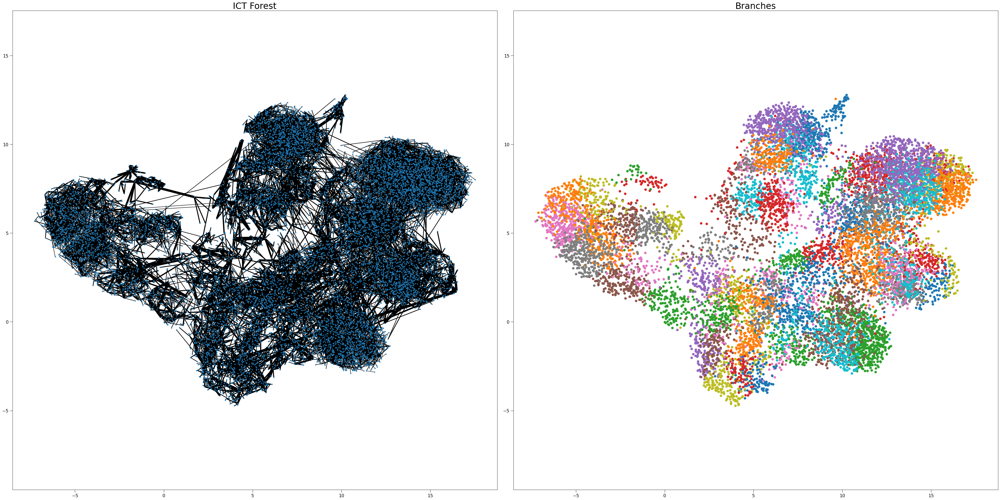

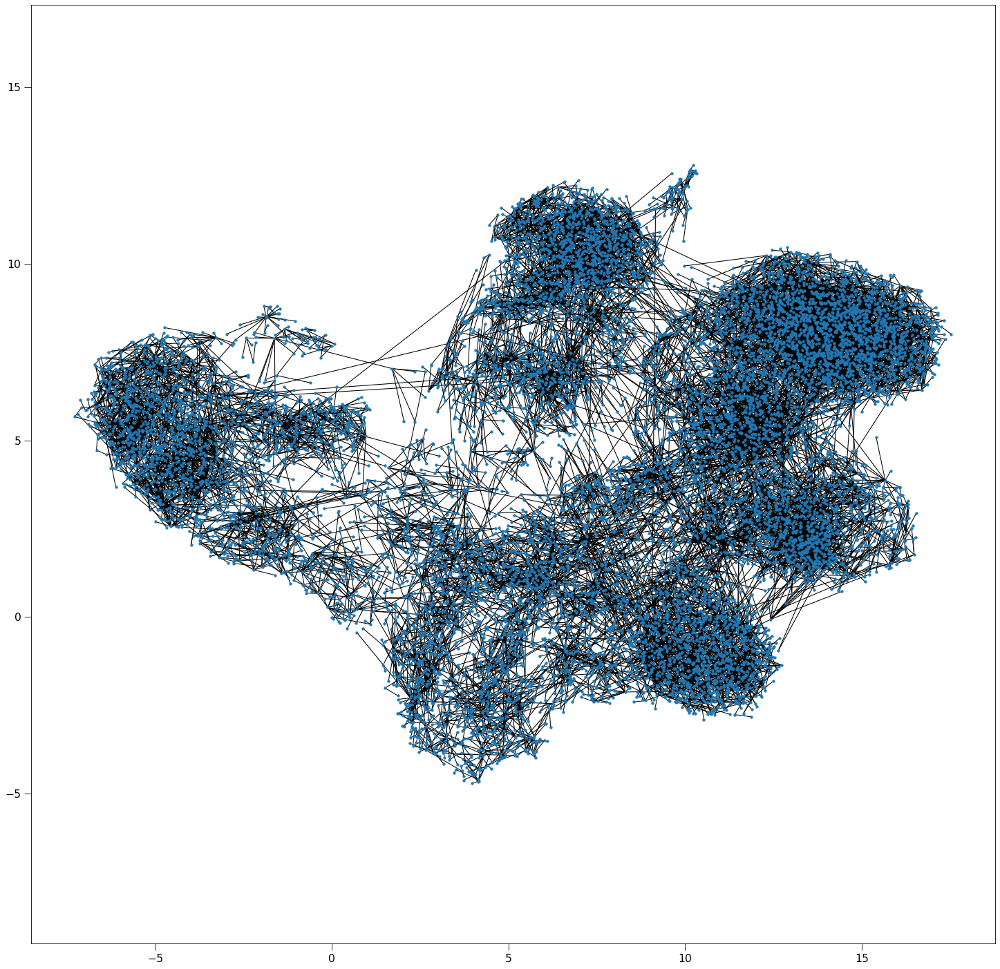

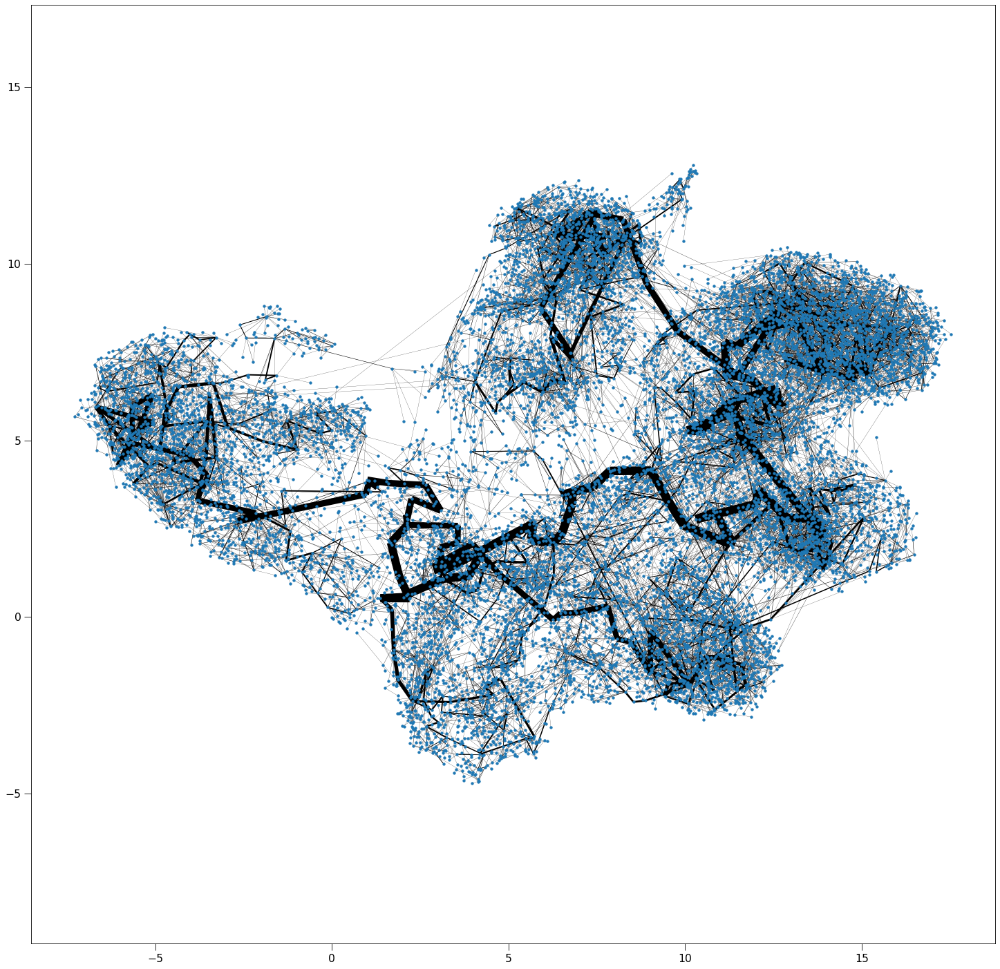

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

None
[]


create edgeId array:   0%|          | 0/13706 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13706 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

update Arr 13706 -> 13706
added 8842 edges early
added 4863 edges early


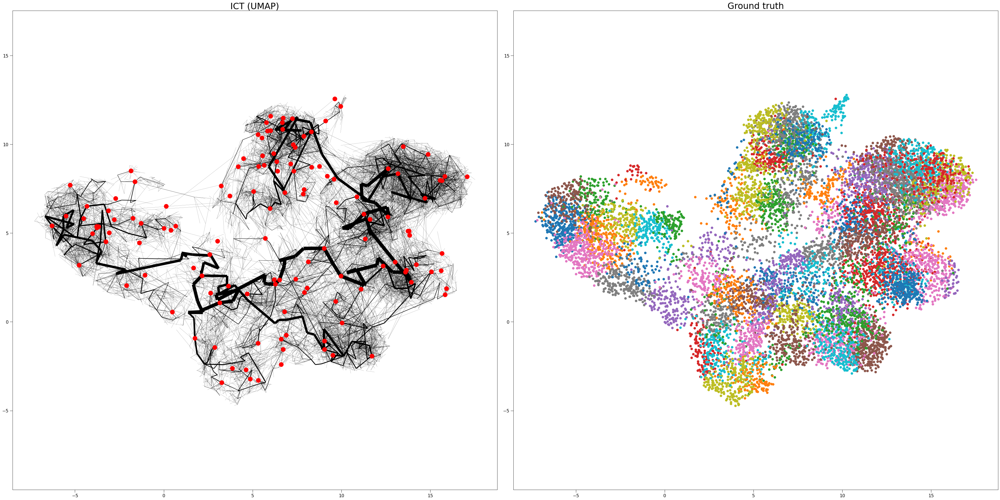

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

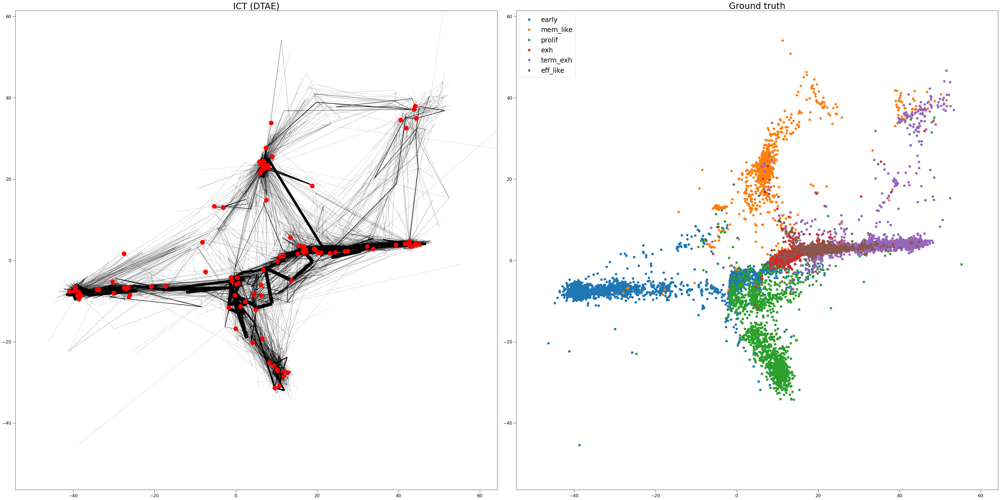

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

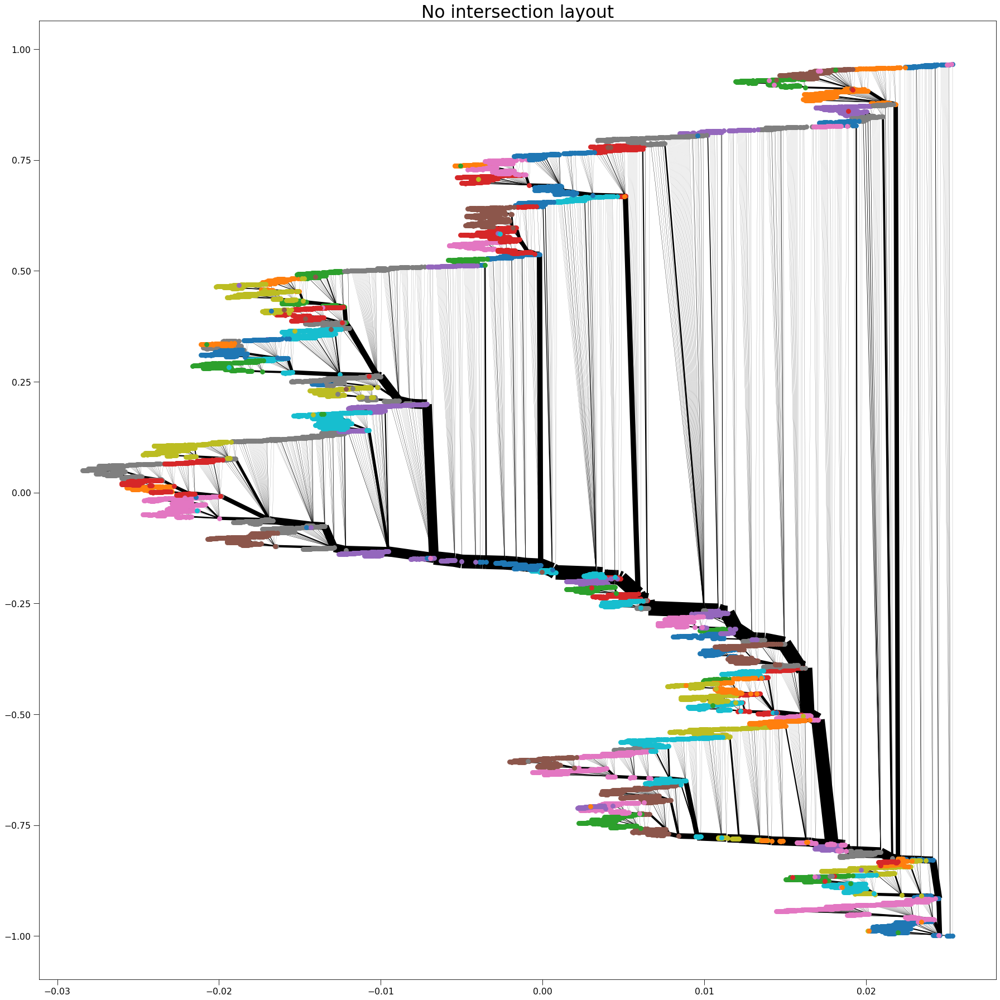

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()